In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

print(Path.cwd())
local = Path.cwd()

/Users/will/enviroment/mdp-portfolio-adaptation-regime-policies/data


In [2]:
 #aqui sempre usamos o atraso, o pib de janeiro só ira ser usado em fevereiro
df = pd.read_parquet('./silver/monthly.parquet')
df

,pib_mensal,desemprego_mensal,inflacao_mensal
data,,,
2000-01-01,NaN,NaN,NaN
2000-02-01,NaN,NaN,NaN
2000-03-01,92576.6,NaN,NaN
2000-04-01,91770.4,NaN,NaN
2000-05-01,92579.9,NaN,NaN
...,...,...,...
2026-02-01,1084819.6,5.1,4.0012
2026-03-01,1027730.3,5.4,3.9351
2026-04-01,1051006.5,5.8,4.2281


In [3]:
df = pd.read_parquet('./gold/macro_features_hmm.parquet')

for i in df.columns:
    print(i)

meta_taxa_selic_zscore
taxa_selic_zscore
taxa_cdi_zscore
dolar_cambio_livre_p_tax_zscore
euro_cambio_livre_zscore
iene_cambio_livre_zscore
ibovespa_br_volatily
ibovespa_br_returns
ibovespa_br_momentum
ibovespa_br_zscore
ibovespa_br_vol_regime
ibovespa_br_pct_change_lag_1m
ibovespa_br_pct_change_lag_3m
s&p500_eua_volatily
s&p500_eua_returns
s&p500_eua_momentum
s&p500_eua_zscore
s&p500_eua_vol_regime
s&p500_eua_pct_change_lag_1m
s&p500_eua_pct_change_lag_3m
dax_alemanha_volatily
dax_alemanha_returns
dax_alemanha_momentum
dax_alemanha_zscore
dax_alemanha_vol_regime
dax_alemanha_pct_change_lag_1m
dax_alemanha_pct_change_lag_3m
shanghai_china_volatily
shanghai_china_returns
shanghai_china_momentum
shanghai_china_zscore
shanghai_china_vol_regime
shanghai_china_pct_change_lag_1m
shanghai_china_pct_change_lag_3m
nikkei_japao_volatily
nikkei_japao_returns
nikkei_japao_momentum
nikkei_japao_zscore
nikkei_japao_vol_regime
nikkei_japao_pct_change_lag_1m
nikkei_japao_pct_change_lag_3m
merv_argentin

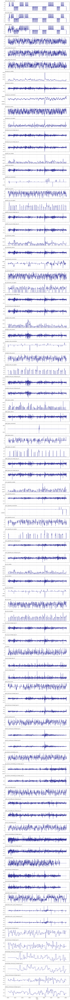

In [4]:
df = pd.read_parquet('./silver/monthly.parquet')
df.head()

df = pd.read_parquet('./gold/macro_features_hmm.parquet')
df_filtered = df[df.index >= '2010-01-01']

import matplotlib.pyplot as plt

# Seleciona as colunas que você quer plotar (ou use df_filtered.columns para todas)
# É recomendável limitar a até 5 ou 6 por vez para não espremer a tela
colunas_para_plotar = df_filtered.columns[:]  

fig, axes = plt.subplots(nrows=len(colunas_para_plotar), ncols=1, figsize=(12, 2 * len(colunas_para_plotar)), sharex=True)

for i, col in enumerate(colunas_para_plotar):
    axes[i].plot(df_filtered.index, df_filtered[col], label=col, color='navy', alpha=0.8)
    axes[i].set_title(col, fontsize=10, loc='left')
    axes[i].grid(True, linestyle='--', alpha=0.5)

plt.xlabel("Data")
plt.tight_layout()
plt.show()


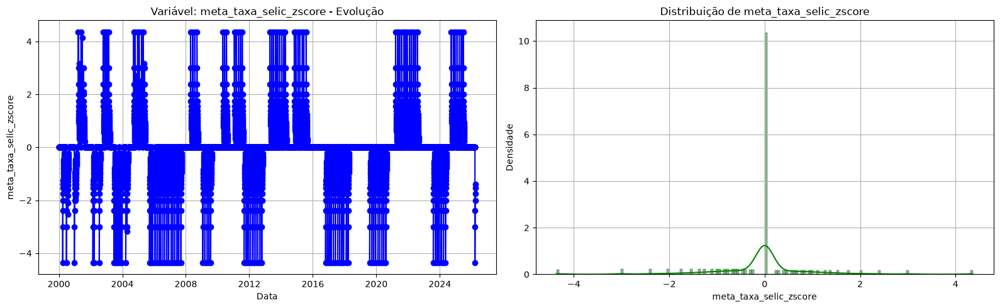

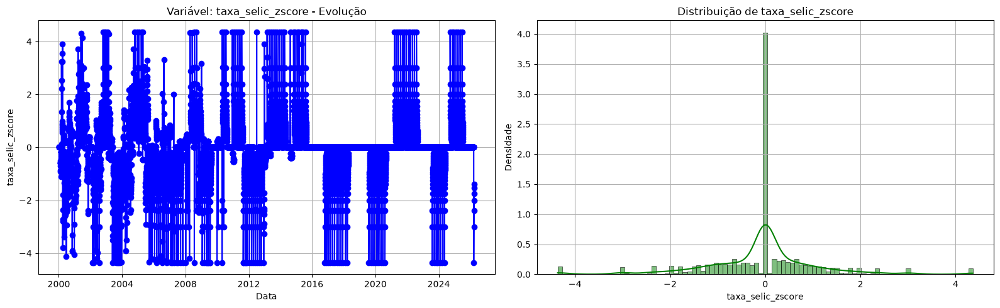

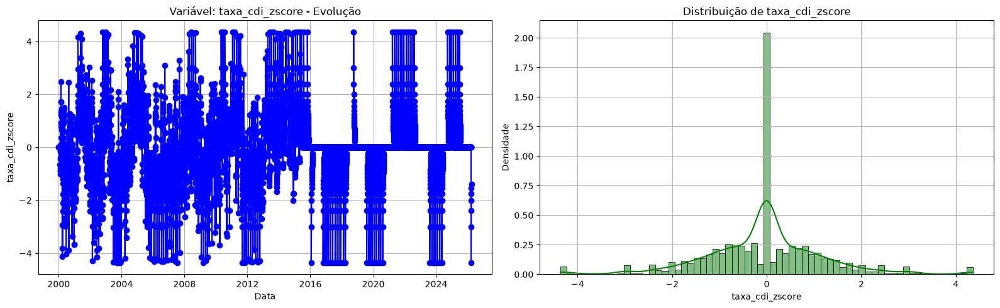

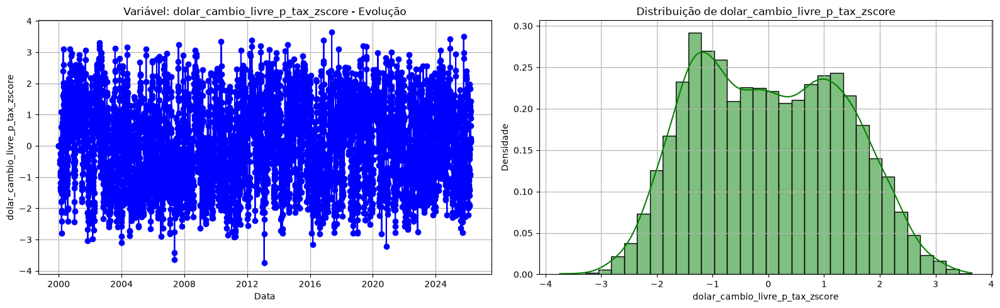

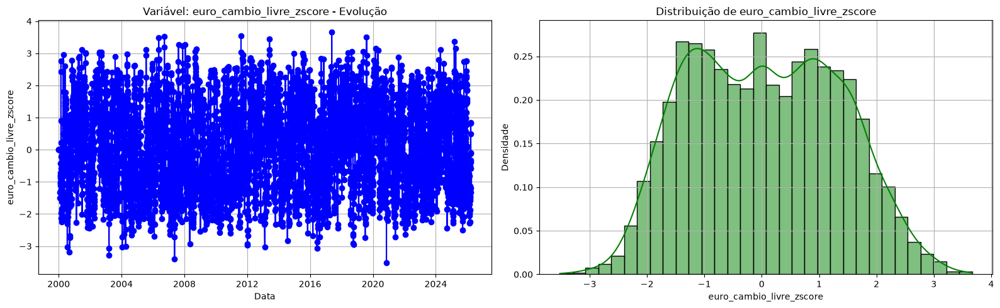

...

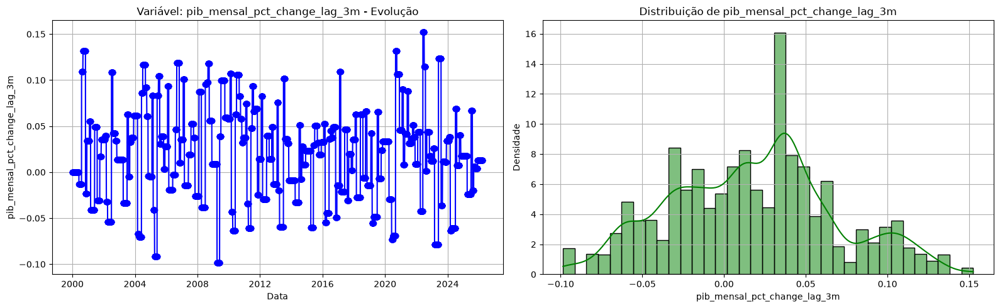

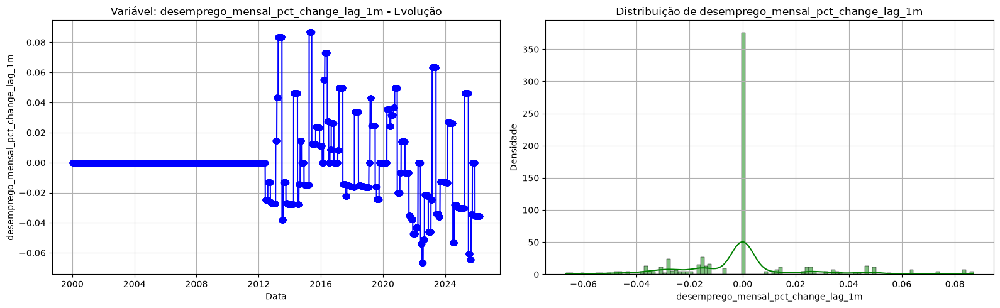

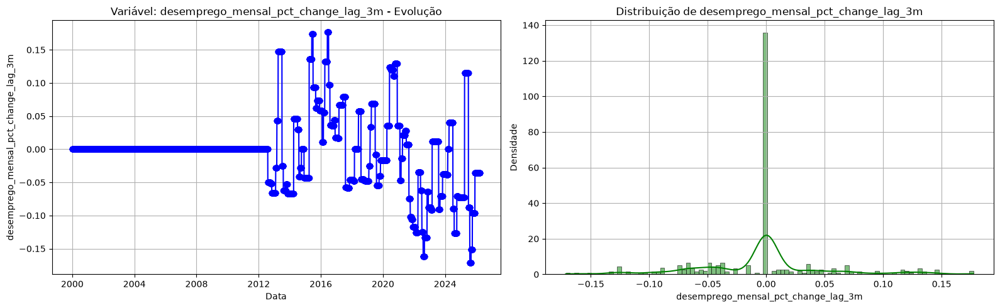

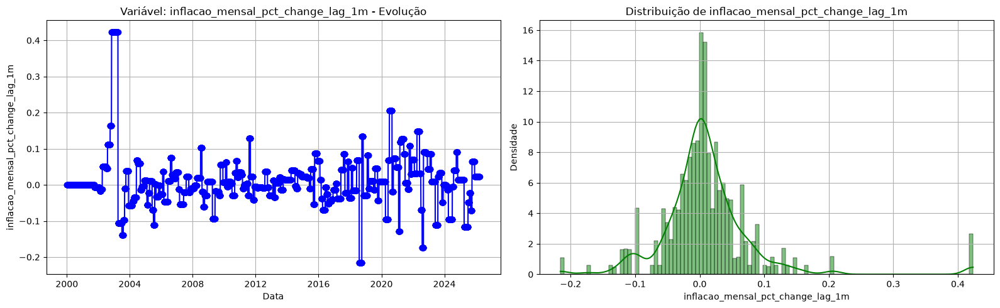

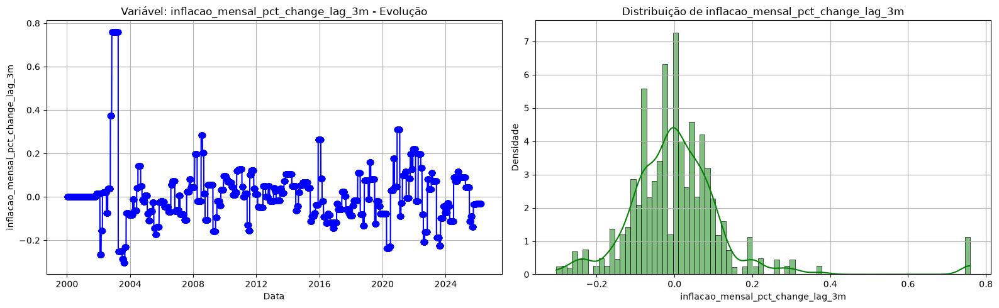

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns


def ploting_time_series_and_dist(df, column_name, title):
    # Cria uma linha com 2 colunas de gráficos
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

    # 1. Gráfico de Série Temporal (Esquerda)
    ax1.plot(df.index, df[column_name], marker="o", linestyle="-", color="b")
    ax1.set_title(f"{title} - Evolução")
    ax1.set_xlabel("Data")
    ax1.set_ylabel(column_name)
    ax1.grid(True)

    sns.histplot(
        data=df, x=column_name, kde=True, ax=ax2, color="g", stat="density"
    )
    ax2.set_title(f"Distribuição de {column_name}")
    ax2.set_xlabel(column_name)
    ax2.set_ylabel("Densidade")
    ax2.grid(True)

    # Ajusta o espaçamento e mostra o par de gráficos
    plt.tight_layout()
    plt.show()


# Loop por todas as colunas numéricas do seu DataFrame
for col in df.select_dtypes(include=["number"]).columns:
    ploting_time_series_and_dist(df, col, f"Variável: {col}")
